## Spotify - Study Songs based on Artist ##

**流程說明**
<hr> 
Step 1. 使用者輸入歌手名稱 <br>
Step 2. 抓取該歌手在Spotify平台上的所有歌曲 <br> 
Step 3. 將歌曲放進訓練好的模型，找出適合讀書的歌曲 <br>
Step 4. 將適合的歌曲放入使用者的Spotify歌單中 <br>

**Import Packages**

In [1]:
# Basic packages
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np

import warnings
warnings.filterwarnings('ignore')

**Import Dataset**

In [2]:
base_data = pd.read_excel("Dataset\\Dataset.xlsx")
base_data.drop(["Unnamed: 0"], axis=1, inplace=True)
base_data.head()

,artist,album,track_name,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,good_for_study
0,IU,IU 5th Album 'LILAC',LILAC,0.738,0.8900,2,-2.275,0,0.0748,0.000002,0.2130,0.750,114.942,214253,4,0
1,Stray Kids,Christmas EveL,DOMINO - English Ver.,0.680,0.8770,7,-2.210,1,0.0425,0.000000,0.0731,0.690,160.063,198733,4,0
2,Pietro Madigan,Pagnossini,Pagnossini,0.373,0.0521,2,-26.050,1,0.0339,0.940000,0.1050,0.246,96.363,146250,4,1
3,Lauv,There's No Way,There's No Way - Alle Farben Remix,0.768,0.8300,11,-4.983,0,0.0361,0.000127,0.1450,0.439,126.005,187301,4,0
4,ThxSoMch,SPIT IN MY FACE!,SPIT IN MY FACE!,0.701,0.5730,1,-9.637,1,0.0695,0.200000,0.1050,0.575,165.995,162010,4,0


### Data Analysis

**Import Packages**

In [3]:
# Drawing package
import matplotlib.pyplot as plt
from matplotlib import colormaps
from matplotlib.colors import Colormap, Normalize

- Copy Dataset

In [4]:
dataset = base_data.copy()

- Information of Dataset

In [5]:
describe = dataset.describe(include='all').T
describe.insert(0, 'dtypes', dataset.dtypes.values)

describe.fillna('-')

,dtypes,count,unique,top,freq,mean,std,min,25%,50%,75%,max
artist,object,1630.0,861,BTS,47,-,-,-,-,-,-,-
album,object,1630.0,1358,Anime Lofi Vol. 3,10,-,-,-,-,-,-,-
track_name,object,1630.0,1594,Flowers,3,-,-,-,-,-,-,-
danceability,float64,1630.0,-,-,-,0.625891,0.146294,0.078,0.545,0.645,0.731,0.961
energy,float64,1630.0,-,-,-,0.565488,0.275705,0.00519,0.34325,0.6185,0.808,0.994
key,int64,1630.0,-,-,-,5.32638,3.616038,0.0,2.0,6.0,8.0,11.0
loudness,float64,1630.0,-,-,-,-9.226607,6.83309,-33.782,-12.23225,-6.6455,-4.4735,-0.005
mode,int64,1630.0,-,-,-,0.560736,0.49645,0.0,0.0,1.0,1.0,1.0
speechiness,float64,1630.0,-,-,-,0.083996,0.076063,0.0236,0.0389,0.05395,0.095575,0.611
instrumentalness,float64,1630.0,-,-,-,0.303201,0.41068,0.0,0.0,0.000049,0.8555,0.981


- Relationships Matrix of Dataset

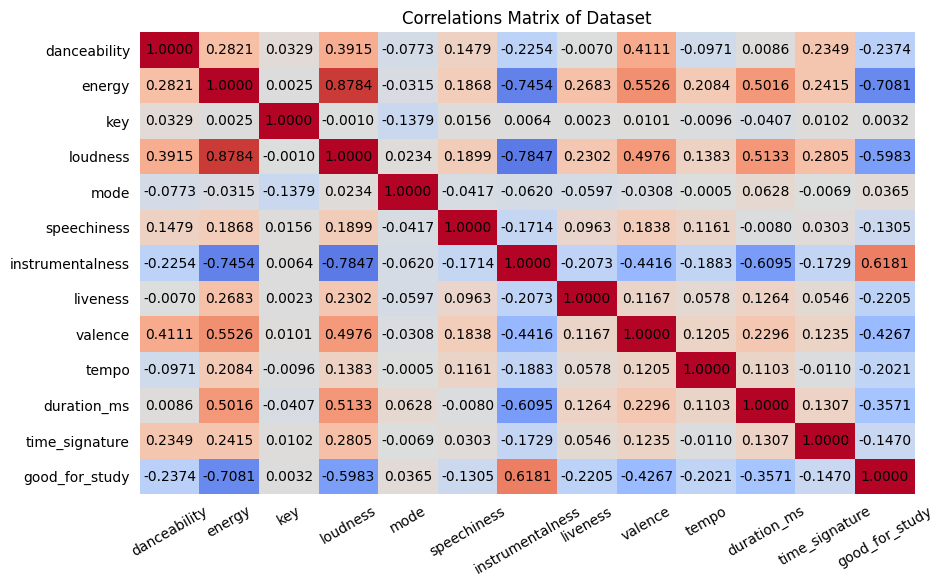

In [6]:
features = "danceability", "energy", "key", "loudness", "mode", "speechiness", "instrumentalness", "liveness", "valence", "tempo", "duration_ms", "time_signature", "good_for_study"
features_count = len(features)
plot = plt.subplot()
plot.spines['top'].set_visible(False)
plot.spines['bottom'].set_visible(False)
plot.spines['left'].set_visible(False)
plot.spines['right'].set_visible(False)

plot.xaxis.set_ticks(np.arange(.5, features_count), features)
plot.xaxis.set_tick_params(rotation=30, left=False)
plot.yaxis.set_ticks(np.arange(.5, features_count), features[::-1])
plot.yaxis.set_tick_params(left=False)
plot.set_xlim(0, features_count)
plot.set_ylim(0, features_count)

plot.set_title('Correlations Matrix of Dataset')

figure = plot.figure
figure.set_figwidth(10)
figure.set_figheight(6)

correlation_martix: pd.DataFrame = dataset.loc[:, features].corr()

cmap: Colormap = colormaps['coolwarm']
nrom = Normalize(-1, 1)

for index, (feature_name, correlations_of_feature) in enumerate(correlation_martix.items()):
    bar = plot.bar(range(features_count), [1] * features_count, 1, features_count - index - 1, color=cmap(nrom(correlations_of_feature.values)), align='edge')
    plot.bar_label(bar, map(lambda x: f'{x:.4f}', correlations_of_feature.values), label_type='edge', padding=-18)

從上圖中顯示，與 good_for_study (預測目標) 參數具有>0.5絕對值關聯性的參數依序為: `energy, instrumentalness, loudness`

#### Distribution of Any Two Features of Dataset

In [7]:
# Setup the function used to count values between intervals to prepare showing scatter plots.

dataset_in_study_list = dataset.loc[dataset['good_for_study'] == 1]
dataset_not_in_study_list = dataset.loc[dataset['good_for_study'] != 1]

def count_feature_in_interval(feature: str, interval_count: int = 10):
    min_value = min(dataset[feature])
    max_value = max(dataset[feature])
    interval = (max_value - min_value) / interval_count
    lower_bounds = np.arange(
        min_value, max_value + interval / 2,
        interval
    )
    
    feature_in_list = np.asarray(dataset_in_study_list[feature])
    feature_not_in_list = np.asarray(dataset_not_in_study_list[feature])

    count_in_list = list(map(
        lambda lower_bound, upper_bound: np.sum(
            (lower_bound <= feature_in_list) &
            (feature_in_list < upper_bound if upper_bound != max_value else True)
        ),
        lower_bounds, lower_bounds[1:]
    ))
    count_not_in_list = list(map(
        lambda lower_bound, upper_bound: np.sum(
            (lower_bound <= feature_not_in_list) &
            (feature_not_in_list < upper_bound if upper_bound != max_value else True)
        ),
        lower_bounds, lower_bounds[1:]
    ))

    return count_in_list, count_not_in_list
    

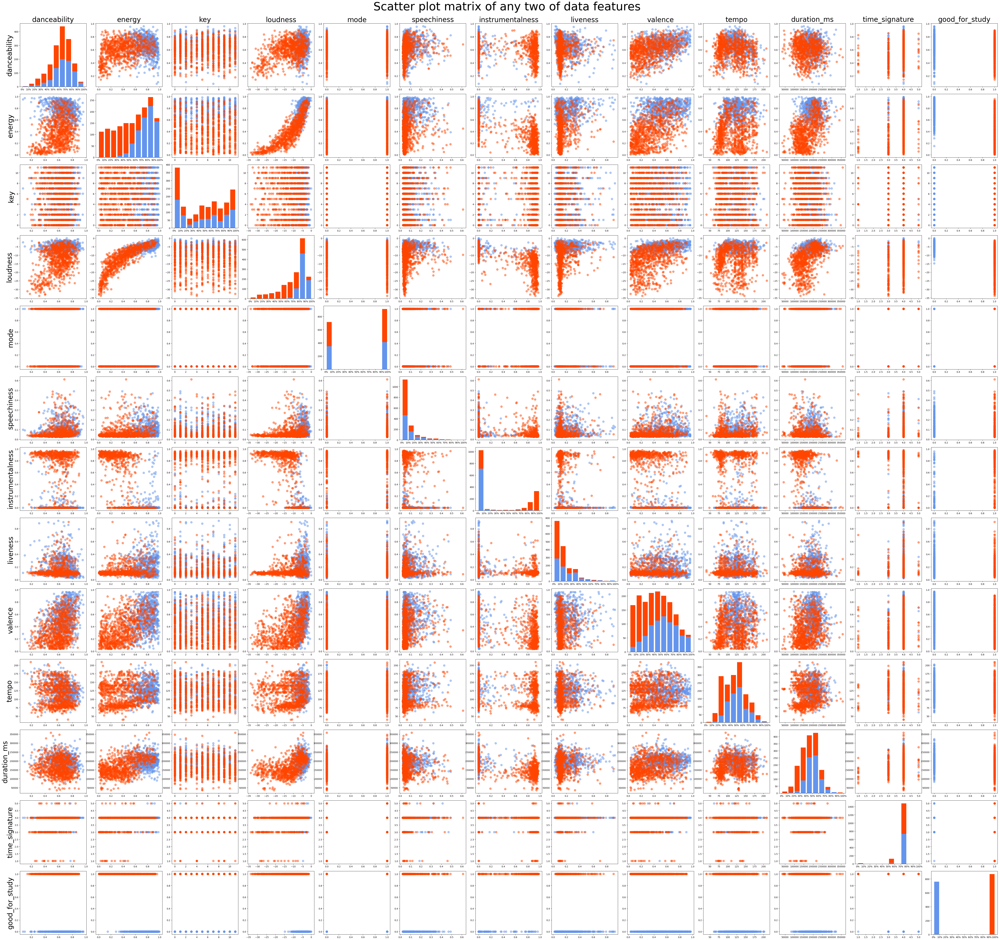

In [8]:
# Show matrix of scatter plots to visualize the relationship between the two of data features.

features = "danceability", "energy", "key", "loudness", "mode", "speechiness", "instrumentalness", "liveness", "valence", "tempo", "duration_ms", "time_signature", "good_for_study"
features_count = len(features)
fig, sub_plots = plt.subplots(features_count, features_count)
fig.set_figwidth(60)
fig.set_figheight(60)
fig.suptitle('Scatter plot matrix of any two of data features', size=50)
fig.tight_layout(rect=[0, 0.03, 1, 0.975])

x_labels = [f'{rate}%' for rate in range(0, 100 + 5, 10)]

memory = set()

for row, featureB in enumerate(features):
    for index, featureA in enumerate(features):
        sub_plot: plt.Axes = sub_plots[row, index]

        if row == 0:
            sub_plot.set_title(featureA, {'size': 30})
        if index == 0:
            sub_plot.set_ylabel(featureB, {'size': 30})

        if featureA == featureB:
            sub_plot.xaxis.set_ticks(np.arange(-.1, 10), x_labels)
            count_in_list, count_not_in_list = count_feature_in_interval(featureA)
            sub_plot.bar(range(10), count_in_list, .8, count_not_in_list, color='orangered', align='edge')
            sub_plot.bar(range(10), count_not_in_list, .8, color='cornflowerblue', align='edge')
        else:
            sub_plot.scatter(
                dataset_not_in_study_list[featureA],
                dataset_not_in_study_list[featureB],
                80,
                'cornflowerblue',
                alpha=.5
            )
            sub_plot.scatter(
                dataset_in_study_list[featureA],
                dataset_in_study_list[featureB],
                80,
                'orangered',
                alpha=.5
            )


上圖顯示學習資料集中的歌曲，任兩項特徵值分布（根據 `good_for_study` 分別著色），可以觀察出以下特徵（不論是與哪項特徵比較）在兩個類別（`good_for_study`）有明顯差異: `energy`、`loudness`

#### Performance(Score) of Each Model - All Features

- Split Data

In [9]:
# Split the data into training and testing with different rates from 5% to 95%

from sklearn.model_selection import train_test_split

features = "danceability", "energy", "key", "loudness", "mode", "speechiness", "instrumentalness", "liveness", "valence", "tempo", "duration_ms", "time_signature"
predict_target = "good_for_study",
features_data = dataset.loc[:, features]
target_data = dataset.loc[:, predict_target]

train_rates: list[float] = [*np.arange(.05, 1, .05)]
train_data_list: list[list[pd.DataFrame]] = [
    train_test_split(features_data, target_data, test_size=rate, random_state=2)
    for rate in train_rates
]

- Drawing Each

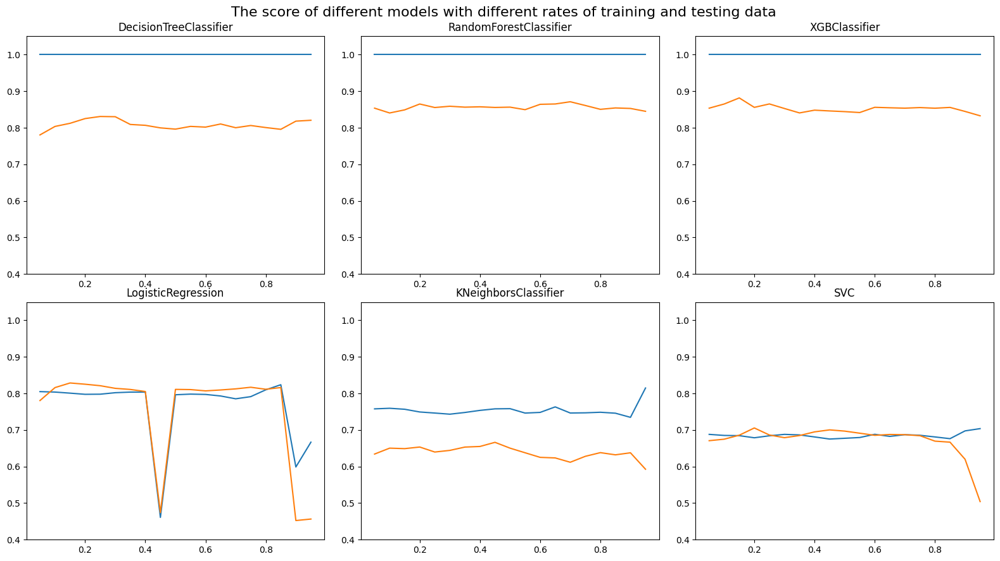

In [10]:
# Training different models and showing the score of each model.

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

fig, sub_plots = plt.subplots(2, 3)

fig.set_figwidth(16)
fig.set_figheight(9)
fig.tight_layout(rect=[0, 0, 1, .95])

fig.suptitle('The score of different models with different rates of training and testing data', fontsize=16)

for index, modelClassifier in zip(
    [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2)],
    [DecisionTreeClassifier, RandomForestClassifier, XGBClassifier, LogisticRegression, KNeighborsClassifier, SVC]
):
    sub_plot: plt.Axes = sub_plots[index]
    sub_plot.set_title(modelClassifier.__name__, {'size': 12})
    sub_plot.set_ylim(0.4, 1.05)

    score_train, score_test = [], []

    for X_train, X_test, y_train, y_test in train_data_list:
        y_train, y_test = y_train.values.ravel(), y_test.values.ravel()

        clf = modelClassifier()
        clf.fit(X_train, y_train)
        
        score_train.append(clf.score(X_train, y_train))

        score_test.append(clf.score(X_test, y_test))
    
    sub_plot.plot(train_rates, score_train)
    sub_plot.plot(train_rates, score_test)

#### Performance(Score) of Each Model - Features Correlation > 0.2

- Split Data

In [11]:
# Only using the features whose correlation is greater than 0.2 (whether positive or negative)

from sklearn.model_selection import train_test_split

features = "danceability", "energy", "loudness", "instrumentalness", "liveness", "valence", "tempo", "duration_ms"
predict_target = "good_for_study",
features_data = dataset.loc[:, features]
target_data = dataset.loc[:, predict_target]

train_rates: list[float] = [*np.arange(.05, 1, .05)]
train_data_list: list[list[pd.DataFrame]] = [
    train_test_split(features_data, target_data, test_size=rate, random_state=2)
    for rate in train_rates
]

- Drawing Each 

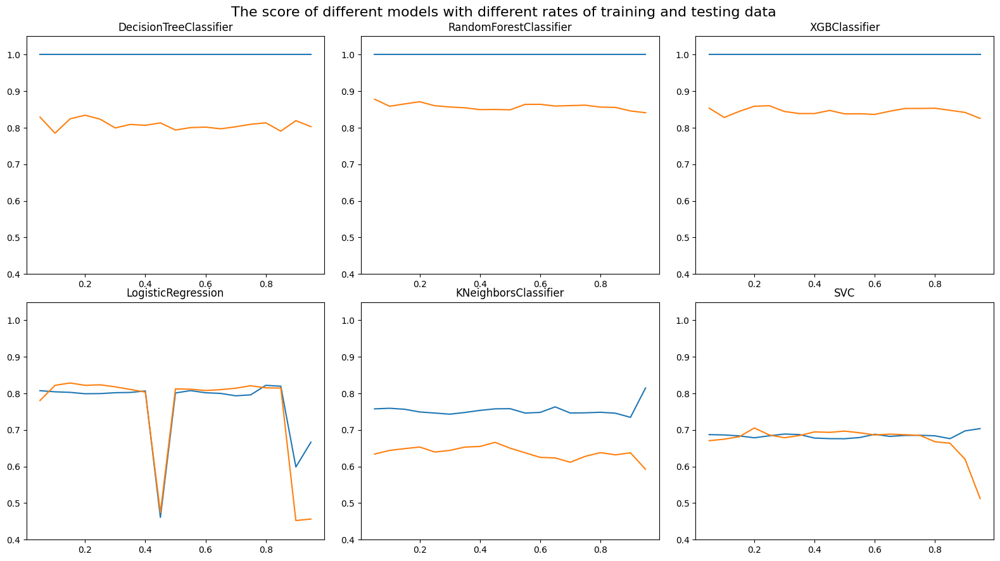

In [12]:
# Training different models and showing the score of each model.

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

fig, sub_plots = plt.subplots(2, 3)

fig.set_figwidth(16)
fig.set_figheight(9)
fig.tight_layout(rect=[0, 0, 1, .95])

fig.suptitle('The score of different models with different rates of training and testing data', fontsize=16)

for index, modelClassifier in zip(
    [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2)],
    [DecisionTreeClassifier, RandomForestClassifier, XGBClassifier, LogisticRegression, KNeighborsClassifier, SVC]
):
    sub_plot: plt.Axes = sub_plots[index]
    sub_plot.set_title(modelClassifier.__name__, {'size': 12})
    sub_plot.set_ylim(0.4, 1.05)

    score_train, score_test = [], []

    for X_train, X_test, y_train, y_test in train_data_list:
        y_train, y_test = y_train.values.ravel(), y_test.values.ravel()

        clf = modelClassifier()
        clf.fit(X_train, y_train)
        
        score_train.append(clf.score(X_train, y_train))

        score_test.append(clf.score(X_test, y_test))
    
    sub_plot.plot(train_rates, score_train)
    sub_plot.plot(train_rates, score_test)

從上圖結果觀察出前四者（DecisionTree, RandomForest, XGBoost, LogisticRegression）有較好的表現，經過資料蒐集調查，XGBoost 的 booster 參數可以使用 gbtree（梯度提升樹），效果較隨機森林與決策樹具有更高的預測效果以及魯棒性。

因此，小組決定使用 XGBoost（將 booster 參數設置為 gbtree）和 Logistic Regression 來進行下階段的模型評估與選擇。

### ML Model

**Import Packages**

In [13]:
# ML packages
import xgboost as xgb
from xgboost import plot_importance
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict

# Evaluation package
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score
from sklearn.metrics import confusion_matrix, roc_curve, auc

- Copy Dataset

In [14]:
data = base_data.copy()

- Let each key/mode be a column

In [15]:
dummy = pd.get_dummies(data, columns = ["key", "mode"])
dummy = dummy.filter(regex="^key_|^mode_")
data = pd.concat([data.drop(["key", "mode"], axis=1), dummy], axis=1)

data.head()

,artist,album,track_name,danceability,energy,loudness,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,good_for_study,key_0,key_1,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_0,mode_1
0,IU,IU 5th Album 'LILAC',LILAC,0.738,0.8900,-2.275,0.0748,0.000002,0.2130,0.750,114.942,214253,4,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
1,Stray Kids,Christmas EveL,DOMINO - English Ver.,0.680,0.8770,-2.210,0.0425,0.000000,0.0731,0.690,160.063,198733,4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
2,Pietro Madigan,Pagnossini,Pagnossini,0.373,0.0521,-26.050,0.0339,0.940000,0.1050,0.246,96.363,146250,4,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3,Lauv,There's No Way,There's No Way - Alle Farben Remix,0.768,0.8300,-4.983,0.0361,0.000127,0.1450,0.439,126.005,187301,4,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
4,ThxSoMch,SPIT IN MY FACE!,SPIT IN MY FACE!,0.701,0.5730,-9.637,0.0695,0.200000,0.1050,0.575,165.995,162010,4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


- Split Data (Get Features and Target)

In [16]:
X = data.drop(["artist", "album", "track_name", "good_for_study"], axis=1)
y = data["good_for_study"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### Logistic Regression 

- Build & Validate Model

In [17]:
def model_validation(c, threshold, X, y):
    # Build model
    glm = LogisticRegression(C = c)  # generalized logistic model
    
    # Make predictions
    estimated_prob = cross_val_predict(glm, X, y, cv = 4, method = 'predict_proba')[:, 1]  # split train & test with cross_val_predict
    
    # Base predictions on thershold
    predicted_y = []
    for p in estimated_prob:
        if p >= threshold:
            predicted_y.append(1)
        else:
            predicted_y.append(0)
    
    # Build confusion matrix with validation data
    cm = confusion_matrix(y, predicted_y)
    
    #Model validation
    accuracy = round(accuracy_score(y, predicted_y), 3)
    precision = round(precision_score(y, predicted_y), 3)
    recall = round(recall_score(y, predicted_y), 3)
    f1 = round(f1_score(y, predicted_y), 3)
    
    return glm, cm, [accuracy, precision, recall, f1], estimated_prob

- Cross Validation

In [18]:
# Try C = 1, threshold = 0.05
print("====================== a test starts ========================")
glm_object, cm, scores, estimated_prob = model_validation(1, 0.05, X, y)
print("C =", 1, ", threshold =", 0.05)
print("                    true positive  true negative")
print("predicted positive:          ", cm[1][1], "          ", cm[0][1])
print("predicted negative:            ", cm[1][0], "           ", cm[0][0])
print("accuracy =", scores[0])
print("precision =", scores[1])
print("recall =", scores[2])
print("F1 score =", scores[3])
print("======================= a test ends =========================\n")

# Find the best C & threshold
print("=========== try several regularization penalties ============")
Cs = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
thresholds = [t / 100 for t in list(range(1, 20))]

max_f1 = 0
best_c = 0
best_threshold = 0
for c in Cs:
    for threshold in thresholds:
        glm_object, cm, scores, estimated_prob = model_validation(c, threshold, X, y)
        cur_f1 = scores[3]
        if cur_f1 > max_f1:
            max_f1 = cur_f1
            best_c = c
            best_threshold = threshold

Cs_ = [t * best_c * 5 for t in list(range(10, 30))]
for c in Cs_:
    for threshold in thresholds:
        glm_object, cm, scores, estimated_prob = model_validation(c, threshold, X, y)
        cur_f1 = scores[3]
        if cur_f1 > max_f1:
            max_f1 = cur_f1
            best_c = c
            best_threshold = threshold
print("=========================== end =============================\n")

# Use the best C & threshold
print("====================== a test starts ========================")
glm_object, cm, scores, estimated_prob = model_validation(best_c, best_threshold, X, y)
print("C =", best_c, ", threshold =", best_threshold)
print("                    true positive  true negative")
print("predicted positive:          ", cm[1][1], "          ", cm[0][1])
print("predicted negative:           ", cm[1][0], "          ", cm[0][0])
print("accuracy =", scores[0])
print("precision =", scores[1])
print("recall =", scores[2])
print("F1 score =", scores[3])
print("======================= a test ends =========================\n")

====================== a test starts ========================
C = 1 , threshold = 0.05
                    true positive  true negative
predicted positive:           864            747
predicted negative:             5             14
accuracy = 0.539
precision = 0.536
recall = 0.994
F1 score = 0.697
======================= a test ends =========================

=========== try several regularization penalties ============
=========================== end =============================

====================== a test starts ========================
C = 5.0 , threshold = 0.19
                    true positive  true negative
predicted positive:           802            458
predicted negative:            67            303
accuracy = 0.678
precision = 0.637
recall = 0.923
F1 score = 0.753
======================= a test ends =========================



- Model Validation

In [19]:
# f1-score
print("=========== F1-Score ============")
scorer = make_scorer(f1_score)
cv_scores = cross_val_score(glm_object, X, y, cv=10, scoring=scorer)
scores = pd.Series(cv_scores)
min_score, mean_score, max_score = scores.min(), scores.mean(), scores.max()

print("Cross-validation F1-scores:", cv_scores)
print(f"Min F1-score: {min_score: .3f}")
print(f"Mean F1-score: {mean_score: .3f}")
print(f"Max F1-score: {max_score: .3f}")
print("=========== Accuracy ============")
# accuracy (default)
cv_scores = cross_val_score(glm_object, X, y, cv=10)
scores = pd.Series(cv_scores)
min_score, mean_score, max_score = scores.min(), scores.mean(), scores.max()
print("Cross-validation accuracy:", cv_scores)
print(f"Min accuracy: {min_score: .3f}")
print(f"Mean accuracy: {mean_score: .3f}")
print(f"Max accuracy: {max_score: .3f}")

=========== F1-Score ============
Cross-validation F1-scores: [0.82840237 0.80722892 0.82926829 0.81528662 0.79532164 0.8
 0.82208589 0.77575758 0.83333333 0.78787879]
Min F1-score:  0.776
Mean F1-score:  0.809
Max F1-score:  0.833
=========== Accuracy ============
Cross-validation accuracy: [0.82208589 0.80368098 0.82822086 0.82208589 0.78527607 0.80368098
 0.82208589 0.77300613 0.82822086 0.78527607]
Min accuracy:  0.773
Mean accuracy:  0.807
Max accuracy:  0.828


- ROC Curve & AUC

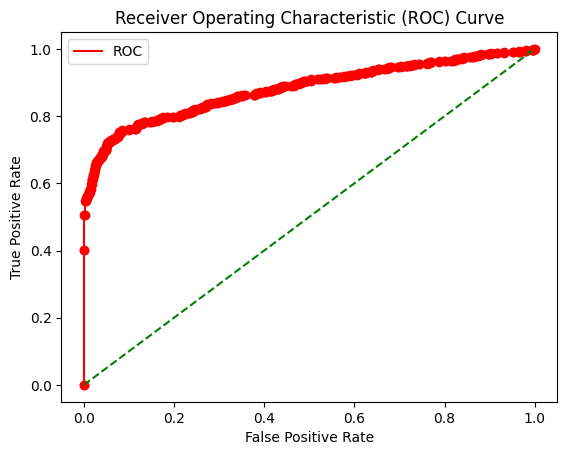

AUC =  0.881


In [20]:
fp_rates, tp_rates, thresholds = roc_curve(y, estimated_prob)

plt.plot(fp_rates, tp_rates, 'o', color = 'red')
plt.plot(fp_rates, tp_rates, color = 'red', label = 'ROC')
plt.plot([0, 1], [0, 1], color = 'green', linestyle = '--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

auc = auc(fp_rates, tp_rates)
print(f"AUC = {auc: .3f}")

參數選擇若是使用Grid交叉驗證不符合時間效益，因此採取手動調整參數。

評估方式以兩種方式進行，第一種是直接比對測試資料與預測資料，第二種是用 F1-score 評分。

#### XGBoost Scikit-learn 接口分類器

`booster` 採用 gbtree 分類會達到最好的效果、二元分類問題，因此將 `num_class` 設為 2，`gamma` 為避免參數過擬和，在 [ 0.1, 0.2, 0.3 ] 分別測試得出0.1最佳、`max_depth` 也同為避免過擬和，在 [3, 4, 5, 6] 得出6最佳、`sub_sample` 設置 0.7 表示每棵樹使用的訓練數據為原始數據集的 70%，提高模型泛化能力、`eta`（學習率）分別測試 [0.01, 0.1, 1] 得到0.1最佳。

- Training Model

In [21]:
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',
    'num_class': 2,
    'gamma': 0.1,
    'max_depth': 6,
    'lambda': 0.5,
    'subsample': 0.7,
    'colsample_bytree': 0.7,
    'min_child_weight': 0.3,
    'learning_rate': 0.1,
    'random_state': 1000,
    'n_jobs': 4,
}

model = xgb.XGBClassifier(**params)
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=0.5, learning_rate=0.1,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=0.3, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=4, num_class=2, num_parallel_tree=None, ...)

- Prediction and Evaluation

Accuracy: 88.34 % 
F1 score: 0.893


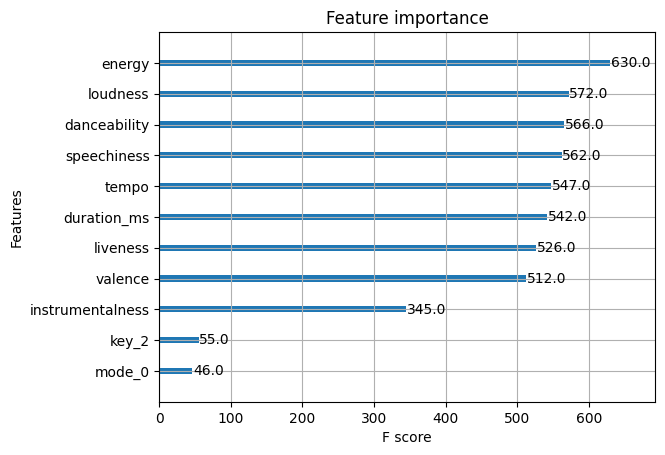

In [22]:
pred = model.predict(X_test)

pro = 0
impro = 0

for i in range(len(y_test)):
    if pred[i] == y_test.iloc[i]:
        pro += 1
    else:
        impro += 1

print("Accuracy: %.2f %% " % (100*pro/ (pro+impro)))
# xgb_score = model.score(X_test, y_test)
# print(f'xgb.score: {xgb_score:.3f}')

cur_f1 = f1_score(y_test, pred)
print(f'F1 score: {cur_f1:.3f}')

plot_importance(model, max_num_features=11)
plt.show()

#### XGBoost 原生接口分類器

- Training Model

In [23]:
# 設定參數
params = {
    'booster': 'gbtree',
    'objective': 'multi:softmax',
    'num_class': 2,
    'gamma': 0.1,
    'max_depth': 6,
    'lambda': 0.5,
    'subsample': 0.7,
    'colsample_bytree': 0.7,
    'min_child_weight': 0.3,
    'eta': 0.1,
    'seed': 1000,
    'nthread': 4,
}
plis = params.copy()

# 轉換成XGB的型別
dtrain = xgb.DMatrix(X_train, y_train)
# 設定訓練迭代次數
num_round = 500
# 訓練模型
model = xgb.train(plis, dtrain, num_round)

- Prediction and Evaluation

Accuracy: 88.96 % 
F1 score: 0.899


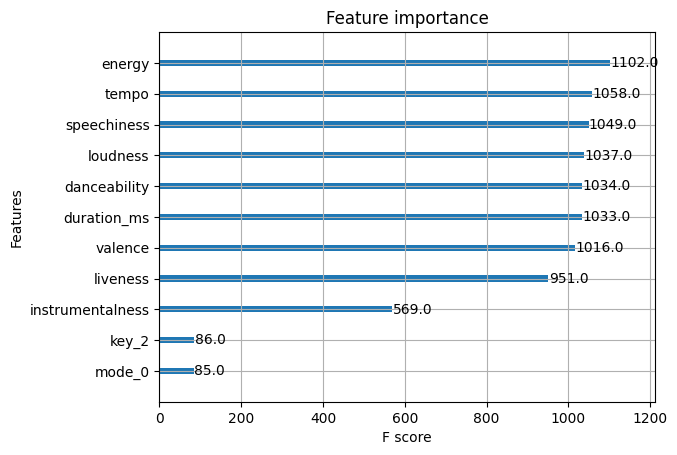

In [24]:
# 轉換成XGB的型別
dtest = xgb.DMatrix(X_test)
# 預測(分類)資料
pred = model.predict(dtest)

# 適合(pro)、不適合(impro)
pro = 0
impro = 0

for i in range(len(y_test)):
    if pred[i] == y_test.iloc[i]:
        pro += 1
    else:
        impro += 1

# Way 1 Evaluation
print("Accuracy: %.2f %% " % (100*pro/ (pro+impro)))
# Way 2 Evaluation
cur_f1 = f1_score(y_test, pred)
print(f'F1 score: {cur_f1:.3f}')

# plot_importance(model)
plot_importance(model, max_num_features=11)
plt.show()

雖然原生接口與sklearn接口在參數相同的情況下，應是相同執行效能。但在算法上仍有些微差異，由於上面結果評分為原生接口稍高一些，以下我們將使用XGB原生接口的分類器進行。

特徵重要性無論使用原生接口還是sklearn接口，`energy` 都是重要性最高的特徵，在 key、mode 兩特徵中，key_2 重要性較高，mode_0 重要性較高。

**Import Packages**

In [25]:
# Spotify packages
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials, SpotifyOAuth

### Function: Get Songs of Artist

In [26]:
# 設定客戶端資料
client_id = '917f3815ac584f34adc01835b9c35a85'
client_secret = 'fdc20f3185cf4e8a950fb5a331dd03a8'
redirect_uri = 'http://localhost:8787'
# scope = 'user-library-read playlist-read-private playlist-modify-private'


def get_songs(
    artist: str, client_id: str, client_secret: str, redirect_uri: str,
    scope: str = 'user-library-read playlist-read-private playlist-modify-private'
) -> pd.DataFrame:
    """
    功能: 依照參數artist取得該歌手的所有歌曲並彙集成DataFrame
    參數: 
        artist (str): 歌手名稱
        client_id (str): Spotify客戶端ID
        client_secret (str): Spotify客戶端secret
        redirect_uri (str): 導向網頁
        scope (str): 客戶端存取權限
    回傳: 
        pd.DataFrame: 該歌手的所有歌曲
    """

    # 創建認證物件
    sp = spotipy.Spotify(
        auth_manager=SpotifyOAuth(
            client_id=client_id,
            client_secret=client_secret,
            redirect_uri=redirect_uri,
            scope=scope
        )
    )

    # 進行歌手搜尋
    results = sp.search(q=artist, type='artist', limit=1)
    artists = results['artists']['items']

    # 列印歌手的名稱和ID
    for artist in artists:
        artist_name = artist['name']
        artist_id = artist['id']
        artist_genres = artist['genres']

        print(f'Artist Name: {artist_name}')
        print(f'Artist ID: {artist_id}')
        print(f'Genres: {artist_genres}')

    # 使用 artist_albums() 方法搜尋該創作者的所有專輯
    albums = sp.artist_albums(artist_id, album_type='album')

    # 逐一列印專輯名稱
    artist_albums = []
    albums_id = []
    for album in albums['items']:
        artist_albums.append(album['name'])
        albums_id.append(album['id'])
    print('Albums: ' + ', '.join(artist_albums))

    # 建立歌曲DataFrame
    columns = [
        'track', 'track_id', 'artist', 'album', 'year', 'acousticness',
        'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
        'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature'
    ]

    songs = pd.DataFrame(columns=columns)

    # 使用 album_tracks() 方法獲取專輯中的每一首歌曲
    for album_id in albums_id:
        album_id = sp.album_tracks(album_id)
        tracks = album_id['items']

        # 顯示專輯中的每一首歌曲名稱
        for track in tracks:
            features = {}
            features['track_id'] = track['id']
            track_info = sp.track(track['id'])

            features['track'] = track_info['name']
            features['artist'] = track_info['artists'][0]['name']
            features['album'] = track_info['album']['name']
            features['year'] = track_info['album']['release_date'][:4]

            audio_features = sp.audio_features(track['id'])[0]
            for feature in columns[5:]:
                features[feature] = audio_features[feature]

            track_df = pd.DataFrame(features, index=[0])
            songs = pd.concat([songs, track_df], ignore_index=True)

    return songs


- Preview results

In [27]:
artist = input("Enter an artist: ")
# [GUI 傳入 artist name]

songs = get_songs(artist, client_id, client_secret, redirect_uri)
songs.head()

Artist Name: Becky G
Artist ID: 4obzFoKoKRHIphyHzJ35G3
Genres: ['latin pop', 'latin viral pop', 'rap latina', 'reggaeton', 'urbano latino']
Albums: ESQUEMAS, MALA SANTA


,track,track_id,artist,album,year,acousticness,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,BUEN DIA,3kI2StwSS4yAl7wdeIXZ8x,Becky G,ESQUEMAS,2022,0.0711,0.510,0.804,7,-3.313,0,0.1710,0.000002,0.1640,0.639,128.924,158173,4
1,FULANITO,3CIl8hlnMcULSIIhUMmB1Z,Becky G,ESQUEMAS,2022,0.2200,0.938,0.832,7,-4.613,0,0.1950,0.000001,0.1210,0.832,111.928,158440,4
2,TAJIN,6stQ6SHIch2zT8yCUbsvWc,Becky G,ESQUEMAS,2022,0.1840,0.889,0.878,9,-1.955,1,0.1330,0.000000,0.0435,0.491,96.958,174547,4
3,FLASHBACK (feat. ELENA ROSE),2xr5g6oX9oNatnf176Ry2m,Becky G,ESQUEMAS,2022,0.3790,0.749,0.617,11,-3.035,1,0.0428,0.000000,0.2220,0.658,136.562,205653,3
4,BAILÉ CON MI EX,2Td8H23gwQZqKubcUOyCSI,Becky G,ESQUEMAS,2022,0.1500,0.761,0.784,4,-4.977,1,0.1330,0.000000,0.1250,0.691,114.930,161880,4


### Function: Using ML Model to Find Songs For Study

In [28]:
from sklearn.base import BaseEstimator

def find_study(model: BaseEstimator, songs: pd.DataFrame) -> pd.DataFrame:

    """
    功能: 找出歌曲列表中適合讀書的歌曲
    參數:
        model (BaseEstimator): 已經訓練好的機器學習模型
        songs (pd.DataFrame): 歌曲列表
    回傳: 
        pd.DataFrame: 適合讀書的歌曲
    """
    
    # Let dataframe of songs be like model accepted
    dummy = pd.get_dummies(songs, columns = ["key", "mode"])
    dummy = dummy.filter(regex="^key_|^mode_")

    for i in range(1, 12):
        if "key_" + str(i) not in dummy.columns:
            dummy.insert(i, "key_"+str(i), 0)

    data = pd.concat([songs.drop(["key", "mode"], axis=1), dummy], axis=1)

    # Drop unnecessary columns
    dsong = data.drop(["track", "track_id", "artist", "acousticness", "album", "year"], axis=1)

    # 預防資料缺失
    for col in dsong.columns:
        dsong[col] = pd.to_numeric(dsong[col], errors='coerce')

    # 預測歌曲
    dsong = xgb.DMatrix(dsong, enable_categorical=True)
    pred = model.predict(dsong)

    # 找出值為1的索引(適合讀書)
    indices = [i for i, val in enumerate(pred) if val == 1]

    # 根據索引選取對應的行
    study_songs = songs.iloc[indices]

    # 回傳Good For Study DataFrame
    return study_songs

- Preview results

In [29]:
study_songs = find_study(model, songs)
study_songs

,track,track_id,artist,album,year,acousticness,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
3,FLASHBACK (feat. ELENA ROSE),2xr5g6oX9oNatnf176Ry2m,Becky G,ESQUEMAS,2022,0.3790,0.749,0.617,11,-3.035,1,0.0428,0.00000,0.222,0.658,136.562,205653,3
6,UNA MAS,7Jw2pfu9u6YaS1LqsoIB7x,Becky G,ESQUEMAS,2022,0.2390,0.604,0.470,7,-5.581,0,0.1250,0.00000,0.114,0.233,199.749,127333,4
22,EN MI CONTRA,2GDyAwz1vg3p73aSgmjdtm,Becky G,MALA SANTA,2019,0.0413,0.808,0.496,11,-6.460,1,0.2310,0.00191,0.118,0.281,90.017,143827,4
26,TE SUPERÉ,2y6EbYibgxMVQ0T5YjZYWN,Becky G,MALA SANTA,2019,0.0550,0.738,0.783,0,-4.576,1,0.0693,0.00000,0.125,0.699,176.027,272120,4


### Add Songs to User Playlist

In [30]:
# scope = 'user-library-read playlist-read-private playlist-modify-public'

def post_songs(
    study_songs: pd.DataFrame, client_id: str, client_secret: str, redirect_uri: str,
    scope: str = 'user-library-read playlist-read-private playlist-modify-public'
) -> None:
    """
    功能: 將篩選出來的歌曲添加至使用者的播放清單
    參數:
        study_songs (pd.DataFrame): 適合讀書的歌曲
        client_id (str): Spotify客戶端ID
        client_secret (str): Spotify客戶端secret
        redirect_uri (str): 導向網頁
        scope (str): 客戶端存取權限
    回傳: 
        bool: 是否執行成功
    """

    # 要添加的歌曲的Spotify曲目URI
    songs_id = []
    for i in study_songs.index:
        songs_id.append('spotify:track:' + study_songs.loc[i, 'track_id'])

    # 使用Spotipy進行身分驗證，請求適當的存取範圍
    sp = spotipy.Spotify(
        auth_manager=SpotifyOAuth(
            client_id=client_id,
            client_secret=client_secret,
            redirect_uri=redirect_uri,
            scope=scope
        )
    )

    # 獲取使用者ID
    user_id = sp.me()['id']
    # 取得使用者當前所有的播放清單
    playlists = sp.current_user_playlists()
    # 印出播放清單
    index = 1
    playlist_ids = {}
    for i in playlists['items']:
        print(f"{index}) {i['name']} ID: {i['id']}")
        playlist_ids[index] = i['id']
        index += 1
    # [GUI 呈現播放清單列表]

    # 取得使用者選擇之播放清單ID
    print("You have following playlists on Spotify.")
    playlist_id = playlist_ids[int(
        input("Input the index of playlists you want to put songs with: "))]

    # 將歌曲添加到播放清單
    sp.user_playlist_add_tracks(user_id, playlist_id, songs_id)


In [31]:
post_songs(study_songs, client_id, client_secret, redirect_uri)

1) Test Playlist ID: 3wWJDYv7rF45ZozaXOmhuc
2) My Playlist ID: 5lH950b0UeH2sqDD7rCWB7
You have following playlists on Spotify.
